# First Models (first approach)

## Libraries

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-v0_8')

In [11]:
# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

## Paths

In [2]:
DATA_ROOT = "./gaitrec_data"
# Train set
UNBALANCED_TRAIN_SET_METADATA_PATH = os.path.join(DATA_ROOT, "unbalanced_train_set_metadata.csv")
POSTPROCESSED_TRAIN_FOLDER = os.path.join(DATA_ROOT, 'postprocessed_train')
GROUPS_SESSIONS_DATA_TRAIN = os.path.join(DATA_ROOT, 'groups_sessions_data_train')
GRF_F_AP_PRO_DATA_TRAIN = os.path.join(DATA_ROOT, 'GRF_F_AP_PRO_data_train')
# Test set
TEST_SET_METADATA_PATH = os.path.join(DATA_ROOT, "test_set_metadata.csv")
TEST_FOLDER = os.path.join(DATA_ROOT, "test_set")
GROUPS_SESSIONS_DATA_TEST = os.path.join(DATA_ROOT, 'groups_sessions_data_test')
GRF_F_AP_PRO_DATA_TEST = os.path.join(DATA_ROOT, 'GRF_F_AP_PRO_data_test')

## Separar las features del target

- Separar las features (valores de la primera sesión) y el target (valores de la última sesión).
- Los valores de la primera sesión corresponden a las filas impares y los valores de la última sesión corresponden a las filas pares. 

In [72]:
def split_df_train_test(df_train: pd.DataFrame, df_test: pd.DataFrame):
    # Select only the columns of interest
    columns_of_interest = df_train.columns[3:]  # Exclude SUBJECT_ID, SESSION_ID, TRIAL_ID
    # Create X_train, y_train, X_test, y_test:
        # Extract the odd rows into X
        # Extract the even rows into y
    X_train = df_train.iloc[::2][columns_of_interest].values
    y_train = df_train.iloc[1::2][columns_of_interest].values
    X_test = df_test.iloc[::2][columns_of_interest].values
    y_test = df_test.iloc[1::2][columns_of_interest].values

    return X_train, y_train, X_test, y_test

Now, my train and test sets contain 101 columns (from F_AP_PRO_1 to F_AP_PRO_101).
Each patient has 2 rows: the first one is the first session, and the second one is the last session (the second row per patient (last session) is the one we want to predict. It is our outcome).

In the dataset there are the right and left legs.  We consider each leg as a different observation, as if we have a new measurement. We interpret it as another patient. The idea now is to make a simple dataset where I have the first session per patient and leg, each leg is like a different patient, and because there is a variation, at the end we have more data. We make an assumption: we consider that they are independent measurements, so it doesn't matter if we put the left and right leg values in this order or if we put the left leg dataset under the right leg dataset. So, in this case, we put the left leg dataset under the right leg dataset.

To split the datasets: 
def split_df_train_test(df_train: pd.DataFrame, df_test: pd.DataFrame):
    # Select only the columns of interest
    columns_of_interest = df_train.columns[3:]  # Exclude SUBJECT_ID, SESSION_ID, TRIAL_ID
    # Create X_train, y_train, X_test, y_test:
        # Extract the odd rows into X
        # Extract the even rows into y
    X_train = df_train.iloc[::2][columns_of_interest].values
    y_train = df_train.iloc[1::2][columns_of_interest].values
    X_test = df_test.iloc[::2][columns_of_interest].values
    y_test = df_test.iloc[1::2][columns_of_interest].values

    return X_train, y_train, X_test, y_test


So now, X_train contains the first session of the patients (right and left legs) and y_train contains the last session of the patients (right and left legs), which is what we want to predict. 

To predict the last sessions of the patients (predict 101 variables), I want to perform a multiple linear regression. Check the assumptions of the multiple linear regression for my case. 


## ANKLE data - 2 sessions

### Load preprocessed data

In [4]:
# train df
combined_legs_2sessions_A_train = pd.read_csv(os.path.join(GRF_F_AP_PRO_DATA_TRAIN, 
                              'groups_2sessions_data_train/A_data/combined.csv'))
# test df
combined_legs_2sessions_A_test = pd.read_csv(os.path.join(GRF_F_AP_PRO_DATA_TEST, 
                              'groups_2sessions_data_test/A_data/combined.csv'))

### EDA

In [6]:
def explore_data(df: pd.DataFrame) -> None:
    """
    Takes in a pandas DataFrame and performs exploratory data analysis.

    Parameters:
    -----------
    df: pandas DataFrame
        The DataFrame to be analyzed.

    Returns:
    --------
    None
    """

    # Print the dimensions of the DataFrame
    print(f"The dataset includes {df.shape[0]} instances (rows) and {df.shape[1]} variables (columns).\n")

    # Display the first few rows of the DataFrame
    display(df.head())
    print("\n")

    # Print the column information for the DataFrame
    print(df.info())
    print("\n")
    
    # Check missing values
    print(f"Missing values: \n{df.isna().sum()}")
    print("\n")

    # Select only the numeric features
    numeric_vars = df.select_dtypes(include=['int64', 'float64']).columns

    # Calculate the descriptive statistics for the numeric variables
    display(df[numeric_vars].describe())
    
    # Check duplicates
    print(f"\n Number of duplicates: {df.duplicated().sum()}")


In [74]:
# EDA train df 
explore_data(combined_legs_2sessions_A_train)

The dataset includes 360 instances (rows) and 104 variables (columns).



,SUBJECT_ID,SESSION_ID,TRIAL_ID,F_AP_PRO_1,F_AP_PRO_2,F_AP_PRO_3,F_AP_PRO_4,F_AP_PRO_5,F_AP_PRO_6,F_AP_PRO_7,F_AP_PRO_8,F_AP_PRO_9,F_AP_PRO_10,F_AP_PRO_11,F_AP_PRO_12,F_AP_PRO_13,F_AP_PRO_14,F_AP_PRO_15,F_AP_PRO_16,F_AP_PRO_17,F_AP_PRO_18,F_AP_PRO_19,F_AP_PRO_20,F_AP_PRO_21,F_AP_PRO_22,F_AP_PRO_23,F_AP_PRO_24,F_AP_PRO_25,F_AP_PRO_26,F_AP_PRO_27,F_AP_PRO_28,F_AP_PRO_29,F_AP_PRO_30,F_AP_PRO_31,F_AP_PRO_32,F_AP_PRO_33,F_AP_PRO_34,F_AP_PRO_35,F_AP_PRO_36,F_AP_PRO_37,F_AP_PRO_38,F_AP_PRO_39,F_AP_PRO_40,F_AP_PRO_41,F_AP_PRO_42,F_AP_PRO_43,F_AP_PRO_44,F_AP_PRO_45,F_AP_PRO_46,F_AP_PRO_47,F_AP_PRO_48,F_AP_PRO_49,F_AP_PRO_50,F_AP_PRO_51,F_AP_PRO_52,F_AP_PRO_53,F_AP_PRO_54,F_AP_PRO_55,F_AP_PRO_56,F_AP_PRO_57,F_AP_PRO_58,F_AP_PRO_59,F_AP_PRO_60,F_AP_PRO_61,F_AP_PRO_62,F_AP_PRO_63,F_AP_PRO_64,F_AP_PRO_65,F_AP_PRO_66,F_AP_PRO_67,F_AP_PRO_68,F_AP_PRO_69,F_AP_PRO_70,F_AP_PRO_71,F_AP_PRO_72,F_AP_PRO_73,F_AP_PRO_74,F_AP_PRO_75,F_AP_PRO_76,F_AP_PRO_77,F_AP_PRO_78,F_AP_PRO_79,F_AP_PRO_80,F_AP_PRO_81,F_AP_PRO_82,F_AP_PRO_83,F_AP_PRO_84,F_AP_PRO_85,F_AP_PRO_86,F_AP_PRO_87,F_AP_PRO_88,F_AP_PRO_89,F_AP_PRO_90,F_AP_PRO_91,F_AP_PRO_92,F_AP_PRO_93,F_AP_PRO_94,F_AP_PRO_95,F_AP_PRO_96,F_AP_PRO_97,F_AP_PRO_98,F_AP_PRO_99,F_AP_PRO_100,F_AP_PRO_101
0,1746,11976,5.500000,-0.004533,-0.000129,0.005483,0.003821,-0.008103,-0.025409,-0.043892,-0.064261,-0.087628,-0.112321,-0.135477,-0.154605,-0.169072,-0.180453,-0.189729,-0.197033,-0.202460,-0.205394,-0.205476,-0.203021,-0.198575,-0.192661,-0.185784,-0.178401,-0.170676,-0.162680,-0.154711,-0.147138,-0.140069,-0.133282,-0.126457,-0.119497,-0.112570,-0.105935,-0.099755,-0.094036,-0.088684,-0.083634,-0.078827,-0.074187,-0.069642,-0.065150,-0.060710,-0.056328,-0.051937,-0.047459,-0.042960,-0.038636,-0.034616,-0.030777,-0.026867,-0.022726,-0.018316,-0.013671,-0.008870,-0.003963,0.001009,0.006042,0.011231,0.016719,0.022602,0.028947,0.035852,0.043386,0.051456,0.059850,0.068387,0.077030,0.085851,0.094891,0.104155,0.113643,0.123351,0.133252,0.143261,0.153253,0.163101,0.172683,0.181861,0.190453,0.198224,0.204934,0.210458,0.214621,0.216995,0.216929,0.213677,0.206556,0.195150,0.179502,0.160239,0.138415,0.115237,0.091950,0.069681,0.049360,0.031920,0.018096,0.007602,-0.000017,-0.004173
1,1746,12037,5.625000,-0.006869,-0.000890,0.008038,0.011478,0.004346,-0.011274,-0.031441,-0.055513,-0.082961,-0.110609,-0.134869,-0.154599,-0.171018,-0.184697,-0.194786,-0.201858,-0.206627,-0.208645,-0.207422,-0.203441,-0.197516,-0.190162,-0.181587,-0.172184,-0.162663,-0.153571,-0.145159,-0.137400,-0.130146,-0.123276,-0.116656,-0.110161,-0.103665,-0.097114,-0.090637,-0.084499,-0.078901,-0.073780,-0.068955,-0.064249,-0.059522,-0.054771,-0.050031,-0.045315,-0.040681,-0.036172,-0.031769,-0.027459,-0.023239,-0.019074,-0.014883,-0.010548,-0.006042,-0.001428,0.003202,0.007827,0.012535,0.017459,0.022697,0.028336,0.034470,0.041221,0.048710,0.056925,0.065763,0.075085,0.084784,0.094752,0.104928,0.115328,0.125984,0.136908,0.148074,0.159445,0.170930,0.182354,0.193476,0.204076,0.213871,0.222519,0.229883,0.235925,0.240602,0.243688,0.244653,0.242829,0.237465,0.227907,0.213825,0.195612,0.174105,0.150356,0.125413,0.100498,0.076889,0.055665,0.037796,0.023901,0.013749,0.006494,0.001724
2,1748,18454,5.166667,0.009228,0.018207,0.020520,0.009092,-0.014986,-0.041766,-0.062416,-0.075588,-0.083213,-0.087562,-0.090452,-0.092994,-0.095795,-0.099083,-0.102874,-0.107029,-0.111115,-0.114669,-0.117404,-0.119170,-0.119979,-0.120085,-0.119722,-0.118978,-0.117844,-0.116300,-0.114255,-0.111631,-0.108395,-0.104661,-0.100572,-0.096232,-0.091673,-0.086869,-0.081773,-0.076384,-0.070782,-0.065091,-0.059408,-0.053803,-0.048338,-0.043062,-0.038008,-0.033213,-0.028689,-0.024433,-0.020411,-0.016554,-0.012790,-0.009051,-0.005253,-0.001328,0.002724,0.006898,0.011191,0.015579,0.020064,0.024706,0.029580,0.034718,0.040068,0.045492,0.050799,0.055769,0.060210,0.064045,0.067385,0.070429,0.073355,0.076313,0.079414,0.082727,0.086268,0.090006,0.093867,0.097733,0.101539,0.105270,0.108972,0.112647,0.11



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360 entries, 0 to 359
Columns: 104 entries, SUBJECT_ID to F_AP_PRO_101
dtypes: float64(102), int64(2)
memory usage: 292.6 KB
None


Missing values: 
SUBJECT_ID      0
SESSION_ID      0
TRIAL_ID        0
F_AP_PRO_1      0
F_AP_PRO_2      0
F_AP_PRO_3      0
F_AP_PRO_4      0
F_AP_PRO_5      0
F_AP_PRO_6      0
F_AP_PRO_7      0
F_AP_PRO_8      0
F_AP_PRO_9      0
F_AP_PRO_10     0
F_AP_PRO_11     0
F_AP_PRO_12     0
F_AP_PRO_13     0
F_AP_PRO_14     0
F_AP_PRO_15     0
F_AP_PRO_16     0
F_AP_PRO_17     0
F_AP_PRO_18     0
F_AP_PRO_19     0
F_AP_PRO_20     0
F_AP_PRO_21     0
F_AP_PRO_22     0
F_AP_PRO_23     0
F_AP_PRO_24     0
F_AP_PRO_25     0
F_AP_PRO_26     0
F_AP_PRO_27     0
F_AP_PRO_28     0
F_AP_PRO_29     0
F_AP_PRO_30     0
F_AP_PRO_31     0
F_AP_PRO_32     0
F_AP_PRO_33     0
F_AP_PRO_34     0
F_AP_PRO_35     0
F_AP_PRO_36     0
F_AP_PRO_37     0
F_AP_PRO_38     0
F_AP_PRO_39     0
F_AP_PRO_40     0
F_AP_PRO_41     0
F_AP_PR

,SUBJECT_ID,SESSION_ID,TRIAL_ID,F_AP_PRO_1,F_AP_PRO_2,F_AP_PRO_3,F_AP_PRO_4,F_AP_PRO_5,F_AP_PRO_6,F_AP_PRO_7,F_AP_PRO_8,F_AP_PRO_9,F_AP_PRO_10,F_AP_PRO_11,F_AP_PRO_12,F_AP_PRO_13,F_AP_PRO_14,F_AP_PRO_15,F_AP_PRO_16,F_AP_PRO_17,F_AP_PRO_18,F_AP_PRO_19,F_AP_PRO_20,F_AP_PRO_21,F_AP_PRO_22,F_AP_PRO_23,F_AP_PRO_24,F_AP_PRO_25,F_AP_PRO_26,F_AP_PRO_27,F_AP_PRO_28,F_AP_PRO_29,F_AP_PRO_30,F_AP_PRO_31,F_AP_PRO_32,F_AP_PRO_33,F_AP_PRO_34,F_AP_PRO_35,F_AP_PRO_36,F_AP_PRO_37,F_AP_PRO_38,F_AP_PRO_39,F_AP_PRO_40,F_AP_PRO_41,F_AP_PRO_42,F_AP_PRO_43,F_AP_PRO_44,F_AP_PRO_45,F_AP_PRO_46,F_AP_PRO_47,F_AP_PRO_48,F_AP_PRO_49,F_AP_PRO_50,F_AP_PRO_51,F_AP_PRO_52,F_AP_PRO_53,F_AP_PRO_54,F_AP_PRO_55,F_AP_PRO_56,F_AP_PRO_57,F_AP_PRO_58,F_AP_PRO_59,F_AP_PRO_60,F_AP_PRO_61,F_AP_PRO_62,F_AP_PRO_63,F_AP_PRO_64,F_AP_PRO_65,F_AP_PRO_66,F_AP_PRO_67,F_AP_PRO_68,F_AP_PRO_69,F_AP_PRO_70,F_AP_PRO_71,F_AP_PRO_72,F_AP_PRO_73,F_AP_PRO_74,F_AP_PRO_75,F_AP_PRO_76,F_AP_PRO_77,F_AP_PRO_78,F_AP_PRO_79,F_AP_PRO_80,F_AP_PRO_81,F_AP_PRO_82,F_AP_PRO_83,F_AP_PRO_84,F_AP_PRO_85,F_AP_PRO_86,F_AP_PRO_87,F_AP_PRO_88,F_AP_PRO_89,F_AP_PRO_90,F_AP_PRO_91,F_AP_PRO_92,F_AP_PRO_93,F_AP_PRO_94,F_AP_PRO_95,F_AP_PRO_96,F_AP_PRO_97,F_AP_PRO_98,F_AP_PRO_99,F_AP_PRO_100,F_AP_PRO_101
count,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000
mean,2041.900000,23165.683333,5.717586,0.006228,0.017233,0.025538,0.022492,0.006169,-0.017128,-0.039761,-0.058030,-0.071975,-0.083133,-0.092770,-0.101465,-0.109331,-0.116266,-0.122105,-0.126694,-0.129962,-0.131898,-0.132541,-0.131975,-0.130327,-0.127735,-0.124364,-0.120386,-0.115950,-0.111172,-0.106157,-0.101017,-0.095828,-0.090636,-0.085466,-0.080338,-0.075269,-0.070287,-0.065426,-0.060713,-0.056172,-0.051818,-0.047664,-0.043713,-0.039953,-0.036368,-0.032935,-0.029627,-0.026419,-0.023287,-0.020208,-0.017157,-0.014112,-0.011053,-0.007963,-0.004821,-0.001615,0.001665,0.005023,0.008461,0.011989,0.015632,0.019413,0.023351,0.027462,0.031758,0.036244,0.040925,0.045795,0.050841,0.056049,0.061405,0.066900,0.072516,0.078235,0.084027,0.089862,0.095714,0.101574,0.107452,0.113352,0.119266,0.125167,0.131007,0.136718,0.142189,0.147272,0.151778,0.155468,0.158049,0.159154,0.158352,0.155141,0.148989,0.139454,0.126349,0.109956,0.091170,0.071413,0.052337,0.035391,0.021453,0.010805,0.003317,-0.001221
std,182.899583,8546.537679,0.897124,0.009102,0.014907,0.020506,0.024690,0.028229,0.031147,0.033066,0.033930,0.034032,0.034091,0.034354,0.034715,0.035176,0.035723,0.036253,0.036685,0.036979,0.037062,0.036812,0.036194,0.035266,0.034059,0.032598,0.030943,0.029204,0.027501,0.025876,0.024348,0.022965,0.021758,0.020719,0.019815,0.019005,0.018264,0.017575,0.016928,0.016318,0.015749,0.015223,0.014745,0.014322,0.013952,0.013633,0.013362,0.013133,0.012943,0.012787,0.012662,0.012568,0.012502,0.012462,0.012452,0.012471,0.012517,0.012588,0.012680,0.012786,0.012906,0.013035,0.013174,0.013325,0.013490,0.013679,0.013900,0.01


 Number of duplicates: 0


### Análisis de correlación 

In [26]:
def calculate_correlation(df: pd.DataFrame, method: str, figsize: tuple = (6, 4)) -> pd.DataFrame:
    """
    Calculates the correlation matrix between numeric features in a pandas DataFrame using a specified correlation method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to calculate the correlation matrix for.
    method (str): The correlation method to use. Valid options are 'pearson', 'spearman', and 'kendall'.
    figsize (tuple): The size of the heatmap plot. Default is (6, 4).
    
    Returns:
    pd.DataFrame: The correlation matrix between numeric features in the DataFrame.
    """
    # select only the numeric features
    numeric_features = df.select_dtypes(include=['int64', 'float64'])
    X = numeric_features
    
    # scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # calculate correlation matrix
    if method == 'pearson':
        corr_matrix = pd.DataFrame(X_scaled).corr(method='pearson')
    elif method == 'spearman':
        corr_matrix = pd.DataFrame(X_scaled).corr(method='spearman')
    elif method == 'kendall':
        corr_matrix = pd.DataFrame(X_scaled).corr(method='kendall')
    else:
        raise ValueError("Invalid correlation method specified. Valid options are 'pearson', 'spearman', and 'kendall'.")
    
    # set column names of correlation matrix
    corr_matrix.columns = numeric_features.columns
    corr_matrix.index = numeric_features.columns
    
    # plot heatmap
    plt.figure(figsize=figsize)
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title(f"Correlation Matrix ({method.capitalize()})")
    plt.show()
    
    return corr_matrix

In [28]:
from sklearn.preprocessing import StandardScaler


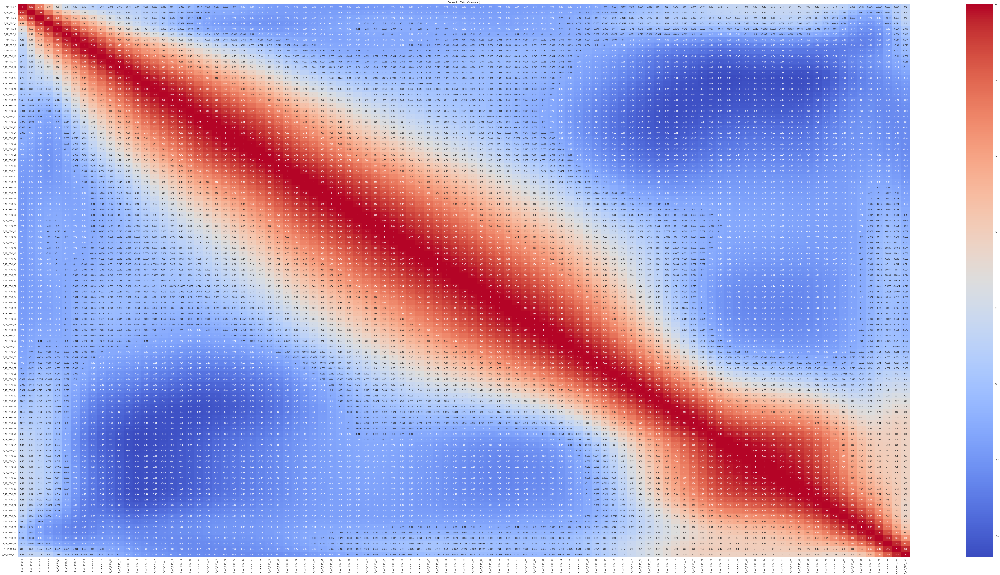

,F_AP_PRO_1,F_AP_PRO_2,F_AP_PRO_3,F_AP_PRO_4,F_AP_PRO_5,F_AP_PRO_6,F_AP_PRO_7,F_AP_PRO_8,F_AP_PRO_9,F_AP_PRO_10,F_AP_PRO_11,F_AP_PRO_12,F_AP_PRO_13,F_AP_PRO_14,F_AP_PRO_15,F_AP_PRO_16,F_AP_PRO_17,F_AP_PRO_18,F_AP_PRO_19,F_AP_PRO_20,F_AP_PRO_21,F_AP_PRO_22,F_AP_PRO_23,F_AP_PRO_24,F_AP_PRO_25,F_AP_PRO_26,F_AP_PRO_27,F_AP_PRO_28,F_AP_PRO_29,F_AP_PRO_30,F_AP_PRO_31,F_AP_PRO_32,F_AP_PRO_33,F_AP_PRO_34,F_AP_PRO_35,F_AP_PRO_36,F_AP_PRO_37,F_AP_PRO_38,F_AP_PRO_39,F_AP_PRO_40,F_AP_PRO_41,F_AP_PRO_42,F_AP_PRO_43,F_AP_PRO_44,F_AP_PRO_45,F_AP_PRO_46,F_AP_PRO_47,F_AP_PRO_48,F_AP_PRO_49,F_AP_PRO_50,F_AP_PRO_51,F_AP_PRO_52,F_AP_PRO_53,F_AP_PRO_54,F_AP_PRO_55,F_AP_PRO_56,F_AP_PRO_57,F_AP_PRO_58,F_AP_PRO_59,F_AP_PRO_60,F_AP_PRO_61,F_AP_PRO_62,F_AP_PRO_63,F_AP_PRO_64,F_AP_PRO_65,F_AP_PRO_66,F_AP_PRO_67,F_AP_PRO_68,F_AP_PRO_69,F_AP_PRO_70,F_AP_PRO_71,F_AP_PRO_72,F_AP_PRO_73,F_AP_PRO_74,F_AP_PRO_75,F_AP_PRO_76,F_AP_PRO_77,F_AP_PRO_78,F_AP_PRO_79,F_AP_PRO_80,F_AP_PRO_81,F_AP_PRO_82,F_AP_PRO_83,F_AP_PRO_84,F_AP_PRO_85,F_AP_PRO_86,F_AP_PRO_87,F_AP_PRO_88,F_AP_PRO_89,F_AP_PRO_90,F_AP_PRO_91,F_AP_PRO_92,F_AP_PRO_93,F_AP_PRO_94,F_AP_PRO_95,F_AP_PRO_96,F_AP_PRO_97,F_AP_PRO_98,F_AP_PRO_99,F_AP_PRO_100,F_AP_PRO_101
F_AP_PRO_1,1.000000,0.923348,0.729158,0.489032,0.296860,0.195246,0.149397,0.124697,0.103795,0.080035,0.073588,0.075133,0.076105,0.069955,0.054584,0.037521,0.019385,-0.004063,-0.025703,-0.040564,-0.059184,-0.075080,-0.086981,-0.094999,-0.107080,-0.119861,-0.135231,-0.148711,-0.160707,-0.166287,-0.172141,-0.178026,-0.180537,-0.183750,-0.184066,-0.184836,-0.186006,-0.185150,-0.186253,-0.181508,-0.177915,-0.172399,-0.167561,-0.167525,-0.169239,-0.171154,-0.171762,-0.175129,-0.176835,-0.176720,-0.177877,-0.178491,-0.178121,-0.177744,-0.176434,-0.175092,-0.174240,-0.170990,-0.164714,-0.161176,-0.158030,-0.153283,-0.147941,-0.141234,-0.133246,-0.120659,-0.107356,-0.089627,-0.068592,-0.049001,-0.031232,-0.012664,0.007036,0.027442,0.045899,0.060102,0.076788,0.097115,0.119124,0.134076,0.143906,0.150521,0.155784,0.158308,0.160775,0.163099,0.164946,0.166690,0.167942,0.166989,0.159644,0.150708,0.131294,0.106431,0.062910,0.025511,-0.001714,-0.002109,0.033056,0.084240,0.115509
F_AP_PRO_2,0.923348,1.000000,0.926154,0.744354,0.550916,0.417372,0.340668,0.288867,0.241493,0.189189,0.152323,0.131623,0.118422,0.102465,0.078096,0.052074,0.023256,-0.008354,-0.035177,-0.055613,-0.079087,-0.098617,-0.112023,-0.120058,-0.130247,-0.140427,-0.152189,-0.162786,-0.170270,-0.172403,-0.173460,-0.174564,-0.173389,-0.171618,-0.168238,-0.165084,-0.162740,-0.159763,-0.158199,-0.153257,-0.149452,-0.144813,-0.141251,-0.142870,-0.145418,-0.150057,-0.151859,-0.155901,-0.158078,-0.160065,-0.162380,-0.164103,-0.164474,-0.164524,-0.163173,-0.161672,-0.160543,-0.156525,-0.148858,-0.142604,-0.136349,-0.129063,-0.121968,-0.113224,-0.103931,-0.088635,-0.071747,-0.053136,-0.032580,-0.014048,-0.000448,0.013870,0.028391,0.044118,0.054812,0.062994,0.072650,0.086590,0.102760,0.114672,0.123570,0.130433,0.136157,0.138647,0.141586,0.143528,0.145159,0.144463,0.142249,0.135957,0.118980,0.098040,0.063446,0.024009,-0.030877,-0.069879,-0.086909,-0.067522,-0.003995,0.079187,0.136154
F_AP_PRO_3,0.729158,0.926154,1.000000,0.929439,0.777320,0.630314,0.525289,0.446687,0.375789,0.300711,0.236230,0.191588,0.159802,0.129476,0.093798,0.059161,0.020486,-0.018052,-0.049991,-0.077077,-0.105684,-0.128704,-0.144205,-0.153790,-0.162491,-0.170511,-0.178529,-0.186300,-0.189085,-0.188418,-0.184311,-0.180124,-0.174497,-0.167284,-0.159012,-0.150627,-0.143536,-0.137215,-0.131888,-0.126411,-0.121784,-0.117330,-0.115016,-0.117426,-0.120165,-0.126012,-0.128607,-0.133586,-0.136923,-0.141464,-0.145690,-0.148882,-0.150461,-0.151598,-0.150880,-0.149873,-0.148374,-0.144385,-0.135815,-0.127685,-0.119029,-0.109340,-0.100390,-0.089634,-0.078358,-0.060385,-0.040427,-0.021355,-0.001711,0.015138,0.025046,0.035259,0.045185,0.056277,0.060464,0.062681,0.065162,0.070702,0.078219,0.084236,0.091104,0.097352,0.103265,0.106156,0.109947,0.112282,0

In [31]:
calculate_correlation(df = combined_legs_2sessions_A_train.drop(['SUBJECT_ID', 'SESSION_ID', 'TRIAL_ID'], axis=1),
                      method="spearman", 
                      figsize= (100,50)) # spearman used because not all data is normalized


### Distribución de las variables 

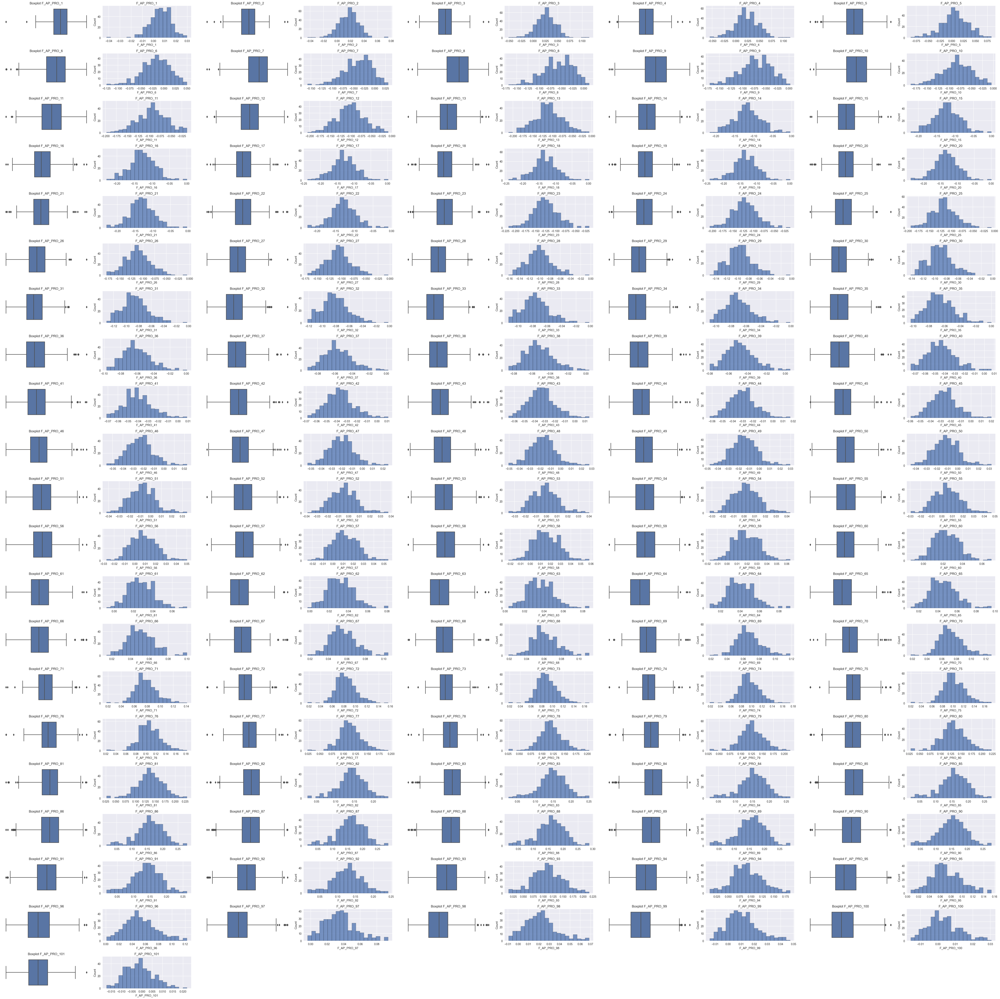

In [71]:
# crear subplots con 5 filas y 2 columnas
plt.style.use('seaborn-v0_8') 
fig, axes = plt.subplots(nrows=21, ncols=10, figsize=(50, 50))

# aplanar la matriz de subplots para iterar más fácilmente
axes = axes.flatten()

# Turn off all axes, and turn them on one-by-one only when you're plotting on them
for ax in axes:
    ax.set_axis_off()

# iterar por cada variable y crear un histograma y boxplot en el subplot correspondiente
for i, col in enumerate(combined_legs_2sessions_A_train.drop(['SUBJECT_ID', 'SESSION_ID', 'TRIAL_ID'], axis=1).columns):

    ax = axes[i*2+1]

    # turn the axis on one-by-one only when you're plotting on them
    ax.set_axis_on()

    sns.histplot(ax=ax, data=combined_legs_2sessions_A_train.drop(['SUBJECT_ID', 'SESSION_ID', 'TRIAL_ID'], axis=1), x=col, bins=20)
    ax.set_title(col)
    
    ax = axes[i*2]
    sns.boxplot(ax=ax, data=combined_legs_2sessions_A_train.drop(['SUBJECT_ID', 'SESSION_ID', 'TRIAL_ID'], axis=1), x=col, showfliers = True)
    ax.set_title("Boxplot " + col)

# ajustar el espacio entre los subplots y mostrar el gráfico
plt.tight_layout()
plt.show()

### Train - Test split

In [8]:
# train - test split 
X_train_A2, y_train_A2, X_test_A2, y_test_A2 = split_df_train_test(
                                                df_train = combined_legs_2sessions_A_train, 
                                                df_test = combined_legs_2sessions_A_test)

## Multiple Linear Regression 

Combinaciones: 
- Regresión lineal múltiple con la X e Y sin reducir.
- Regresión lineal múltiple con PCA de la X (reducida) e Y sin reducir.
- Regresión lineal múltiple con la X sin reducir y con PCA de la Y (reducida).
- Regresión lineal múltiple con con PCA de la X e Y (las dos reducidas)


### Assumptions

Assumption of Regression Model :

- Linearity: The relationship between dependent and independent variables should be linear.
- Homoscedasticity: Constant variance of the errors should be maintained.
- Multivariate normality: Multiple Regression assumes that the residuals are normally distributed.
- Lack of Multicollinearity: It is assumed that there is little or no multicollinearity in the data.

#### Linealidad 

Most common way to check linearity is to scatter-plot residuals (studentized preferably) against the linearly predicted values. Curved or non-horizontally spead cloud on such a plot is diagnostic for non-linearity. To uncover more hidden (partial) non-linearity plot the residuals against each of the predictors. 
- https://stats.stackexchange.com/questions/70009/how-do-you-check-the-linearity-of-a-multiple-regression

Residual Plots: After fitting the multiple linear regression model, you can create scatterplots of the residuals against each independent variable. This can provide insights into any non-linear patterns or heteroscedasticity. For a large number of variables, it may be more manageable to focus on variables with higher importance or those that are theoretically expected to have a significant impact on the outcome.




### Model 1: Multiple Linear Regression con la X e y sin reducir

In [9]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error


In [14]:
# Fit the multiple linear regression model using the training data:
model_A2 = LinearRegression()
model_A2.fit(X_train_A2, y_train_A2)

LinearRegression()

In [15]:
# Calculate the linearly predicted values
y_train_A2_predicted = model_A2.predict(X_train_A2)

In [16]:
# Calculate the residuals (difference between the observed and predicted values)
residuals_A2 = y_train_A2 - y_train_A2_predicted

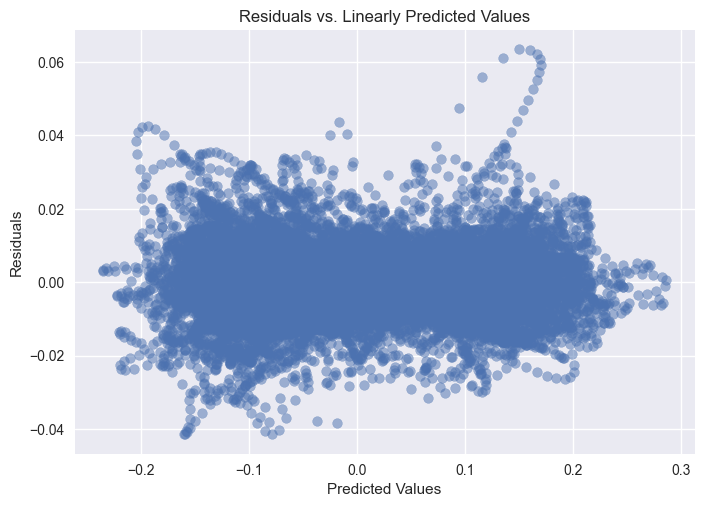

In [17]:
# Scatterplot of residuals against linearly predicted values
plt.scatter(y_train_A2_predicted, residuals_A2, alpha=0.5)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Linearly Predicted Values")
plt.show()

- Linearity: Look for a random scatter of points around the horizontal line (y = 0). If the points exhibit a clear pattern or show a non-linear relationship, it suggests a violation of the linearity assumption.



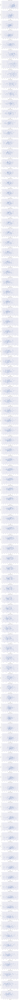

In [24]:
# Scatterplot of residuals against individual predictors:
num_predictors = X_train_A2.shape[1] # 101 predictors
fig, axs = plt.subplots(num_predictors, figsize=(8, num_predictors * 4))
for i in range(num_predictors):
    axs[i].scatter(X_train_A2[:, i], residuals_A2[:, i], alpha=0.5)
    axs[i].set_xlabel("Predictor")
    axs[i].set_ylabel("Residuals")
    axs[i].set_title(f"Residuals vs. Predictor {i+1}")
plt.tight_layout()
plt.show()


In [26]:
cv_scores = cross_val_score(model_A2, X_train_A2, y_train_A2, cv=10, scoring='neg_mean_squared_error')


In [27]:
cv_mse = -cv_scores
cv_rmse = np.sqrt(cv_mse)

In [28]:
y_pred_A2 = model_A2.predict(X_test_A2)
test_mse = mean_squared_error(y_test_A2, y_pred_A2)
test_rmse = np.sqrt(test_mse)


In [29]:
print("Cross-validated RMSE:", cv_rmse.mean())
print("Test set RMSE:", test_rmse)

Cross-validated RMSE: 0.027673307958552495
Test set RMSE: 0.021544001275171077


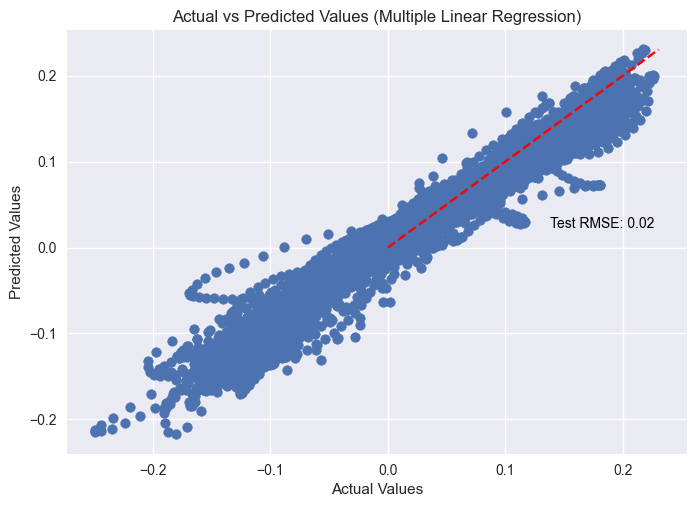

In [37]:
# Scatter plot of actual vs predicted values
plt.scatter(y_test_A2, y_pred_A2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values (Multiple Linear Regression)')

# Plot a diagonal line for reference
max_value = max(y_test_A2.max(), y_pred_A2.max())
plt.plot([0, max_value], [0, max_value], color='red', linestyle='--')

# Display RMSE as text
plt.text(max_value * 0.6, max_value * 0.1, f'Test RMSE: {test_rmse:.2f}', color='black')

# Show the plot
plt.show()


### Model 2: 

In [44]:
def perform_pca(df: pd.DataFrame, target_variable: str, n_components: int = 3) -> Tuple[pd.DataFrame, pd.DataFrame]:
    
    """
    Perform principal component analysis (PCA) on a DataFrame with numeric features and plot the variance explained by each 
    principal component and the loadings for each principal component. Returns the loadings for each component and the transformed data.

    Parameters:
    -----------
    df : pd.DataFrame
        DataFrame with numeric features.
    target_variable : str
        Name of the target variable column to be removed from the DataFrame.
    n_components : int, optional
        Number of principal components to compute. Default is 3.

    Returns:
    --------
    Tuple[pd.DataFrame, pd.DataFrame]
        Tuple containing the loadings for each component and the transformed data.
        
    Example:
    --------
    # perform PCA on the DataFrame
    loadings, transformed_data = perform_pca(df, 'target_variable', 2)
    """

    # remove the target variable from the DataFrame 
    #df = df.drop(columns=target_variable)
    
    # select only the numeric features and drop na values 
    numeric_features = df.select_dtypes(include=['int64', 'float64']).dropna()    
    X = numeric_features
    
    # scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # apply PCA
    pca = PCA(n_components=n_components)
    pca.fit(X_scaled)

    # calculate the variance explained by each component
    variance = pd.DataFrame({'variance': pca.explained_variance_ratio_*100, # *100: Percentage of explained variances
                             'PC': ['PC{}'.format(i) for i in range(1, n_components+1)]})
    variance = variance.sort_values('variance', ascending=False)

    # plot the variance explained by each component
    sns.barplot(x='PC', y='variance', data=variance, color='blue')
    plt.title('Variance explained by each principal component')
    plt.xlabel('Principal Component')
    plt.ylabel('Percentage of explained variances') 
    plt.show()

    # get the loadings for each component
    loadings = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i) for i in range(1, n_components+1)], index=X.columns)

    # plot the loadings for each principal component
    n_rows = (n_components + 1) // 2
    fig, axs = plt.subplots(n_rows, 2, figsize=(15, 6 * n_rows), sharey=False, gridspec_kw={'hspace': 0.4, 'wspace': 0.5})
    
    for i in range(n_components):
        row = i // 2
        col = i % 2
        loadings_pc = loadings[f'PC{i+1}'].abs().sort_values(ascending=False)
        sns.barplot(x=loadings_pc.values, y=loadings_pc.index, ax=axs[row, col], color='blue', order=loadings_pc.index)
        axs[row, col].set_title(f'Loadings for PC{i+1}')
        axs[row, col].set_xlabel('Loading Value')
        axs[row, col].set_ylabel('Variable')
        
    # adjust the subplots if n_components is odd to remove an empty subplot
    if n_components % 2 != 0:
        axs[n_rows-1, 1].remove()

    plt.show()

    # return the transformed data and the loadings
    transformed_data = pd.DataFrame(pca.transform(X_scaled), columns=['PC{}'.format(i) for i in range(1, n_components+1)])
    return loadings, transformed_data

NameError: name 'Tuple' is not defined

In [ ]:
### MARTA
def apply_pca(data, labels):
    # Instanciar objeto PCA y aplicar
    pca = PCA()
    pca.fit(data)
    data_pca = pca.transform(data)
    print("Shape of X_pca:", data_pca.shape)

    # Obtener la varianza explicada por cada componente principal
    explained_variances = pca.explained_variance_ratio_

    # Imprimir la varianza explicada por cada componente principal
    for i, variance in enumerate(explained_variances):
        print(f"Varianza Componente {i+1}: {variance}")

    # Graficar la varianza explicada por cada componente principal
    plt.figure(figsize=(16, 9))
    plt.bar(range(1, len(explained_variances) + 1), explained_variances, alpha=0.7)
    plt.xlabel('Componente')
    plt.ylabel('Varianza')
    plt.title('Varianza explicada por cada componente')
    plt.show()
    plt.savefig("varianza_explicada.png")

    # Graficar el acumulado de varianza explicada en las nuevas dimensiones
    plt.figure(figsize=(16, 9))
    plt.plot(np.cumsum(explained_variances))
    plt.xlabel('Número de componentes')
    plt.ylabel('Varianza acumulada explicada')
    plt.show()

    # Graficar en 2 Dimensiones, tomando los 2 primeros componentes principales
    Xax = data_pca[:, 0]
    Yax = data_pca[:, 1]
    cdict = {0: 'green', 1: 'red', 2: 'orange'}
    labl = {0: 'control', 1: 'esquizofrenia', 2: 'bipolar'}
    marker = {0: '*', 1: 'o', 2: '^'}
    fig, ax = plt.subplots(figsize=(16, 9))
    fig.patch.set_facecolor('white')
    for l in np.unique(labels):
        ix = np.where(labels == l)
        ax.scatter(Xax[ix], Yax[ix], c=cdict[l], label=labl[l], s=50, marker=marker[l])
    plt.xlabel(f"PC1 ({'{:.2f}%'.format(explained_variances[0]*100)})", fontsize=14)
    plt.ylabel(f"PC2 ({'{:.2f}%'.format(explained_variances[1]*100)})", fontsize=14)
    plt.legend()
    plt.show()